In [43]:
import pandas as pd
import os
from os.path import join
import numpy as np
import mne
from mne_bids import (
    BIDSPath,
    read_raw_bids,
    print_dir_tree,
    make_report,
    find_matching_paths,
    get_entity_vals,
)

import h5py
from os.path import join as opj
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
import tqdm
from versatile_diffusion_dual_guided_fake_images import *

from torchsummary import summary
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix


In [2]:
preproc_dir="/home/matteo/data/THINGS_MEG/LOCAL/ocontier/thingsmri/openneuro/THINGS-data/THINGS-MEG/ds004212/derivatives/preprocessed/"
p=1
epochs = mne.read_epochs(f'{preproc_dir}/preprocessed_P{str(p)}-epo.fif', preload=False)

Reading /home/matteo/data/THINGS_MEG/LOCAL/ocontier/thingsmri/openneuro/THINGS-data/THINGS-MEG/ds004212/derivatives/preprocessed/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/matteo/data/THINGS_MEG/LOCAL/ocontier/thingsmri/openneuro/THINGS-data/THINGS-MEG/ds004212/derivatives/preprocessed/preprocessed_P1-epo-1.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/matteo/data/THINGS_MEG/LOCAL/ocontier/thingsmri/openneuro/THINGS-data/THINGS-MEG/ds004212/derivatives/preprocessed/preprocessed_P1-epo-2.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/matteo/data/THINGS_MEG/LOCAL/ocontier/thingsmri/openneuro/THINGS-data/THINGS-MEG/ds004212/derivatives/preprocessed/preprocessed_P1-epo-3.fif ...
    Found

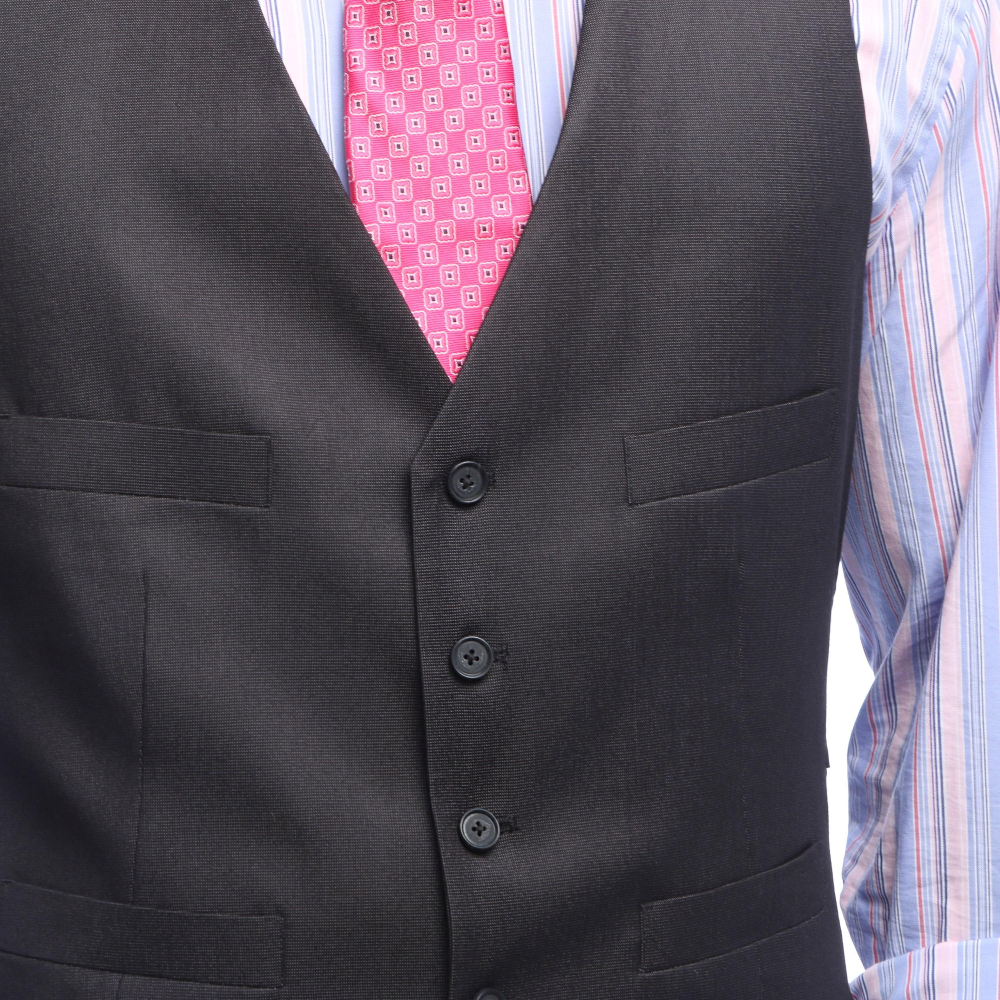

In [3]:
train_data=epochs[epochs.metadata["trial_type"] == "exp"]
test_data=epochs[epochs.metadata["trial_type"] == "test"]

#try to load images

stimuli_path=opj("/home/matteo/data/THINGS_img/THINGS","Images")

img_class=train_data.metadata.image_path.iloc[0].split("images_meg/")[-1].split("/")[0]
img_name=train_data.metadata.image_path.iloc[0].split("images_meg/")[-1].split("/")[1]

Image.open(opj(stimuli_path,img_class,img_name))

In [4]:
img_train=[opj(stimuli_path,img_class,img_name) for img_class,img_name in zip(train_data.metadata.image_path.str.split("images_meg/").str[0],train_data.metadata.image_path.str.split("images_meg/").str[1])]
# img_test=[opj(stimuli_path,img_class,img_name) for img_class,img_name in zip(test_data.metadata.image_path.str.split("images_test_meg/").str[0],test_data.metadata.image_path.str.split("images_meg/").str[1])]  
# 
# test_data.metadata.image_path.iloc[0].split("images_test_meg/")[-1]

img_test=[]
for i in range(len(test_data.metadata)):
    filename=test_data.metadata.image_path.iloc[i].split("images_test_meg/")[-1]
    img_class=filename[:filename.rfind("_")]
    img_test.append(opj(stimuli_path,img_class,filename))
  

In [5]:
batch=64
device="cuda:0"

pipe_embed = VersatileDiffusionDualGuidedFromCLIPEmbeddingPipeline.from_pretrained("shi-labs/versatile-diffusion", )

pipe_embed.remove_unused_weights()
pipe_embed = pipe_embed.to(device)

Fetching 17 files: 100%|██████████| 17/17 [00:00<00:00, 91064.07it/s]


In [6]:
#get representations

test_clip_img_embeds=[]
with torch.no_grad():
    for i in tqdm.tqdm(range(0,len(img_test),batch)):

        #save img data
        y= img_test[i:i+batch]
                         
        images=[Image.open(i).convert("RGB") for i in y]

        #encode images in CLIP
        image_features=pipe_embed._encode_image_prompt(images,device=device,num_images_per_prompt=1,do_classifier_free_guidance=False).cpu()
        test_clip_img_embeds.append(image_features)

    
        
    test_clip_img_embeds = torch.cat(test_clip_img_embeds,axis=0)
    

100%|██████████| 38/38 [00:53<00:00,  1.41s/it]


In [10]:
class Encoder(nn.Module):
    def __init__(self, num_input_channels: int, base_channel_size: int, latent_dim: int, act_fn: object = nn.GELU):
        """
        Args:
           num_input_channels : Number of input channels of the image. For CIFAR, this parameter is 3
           base_channel_size : Number of channels we use in the first convolutional layers. Deeper layers might use a duplicate of it.
           latent_dim : Dimensionality of latent representation z
           act_fn : Activation function used throughout the encoder network
        """
        super().__init__()
        c_hid = base_channel_size
        self.net = nn.Sequential(
            nn.Conv1d(num_input_channels, c_hid, kernel_size=3, padding=1, stride=3),  # 32 => 16
            act_fn(),
            nn.Conv1d(c_hid, c_hid, kernel_size=3, padding=1,stride=2),
            act_fn(),
            nn.Conv1d(c_hid, 2 * c_hid, kernel_size=3, padding=1, stride=2),  # 16 => 8
            act_fn(),
            nn.Conv1d(2 * c_hid, 2 * c_hid, kernel_size=3, padding=1,stride=2),
            act_fn(),
            nn.Conv1d(2 * c_hid, 2 * c_hid, kernel_size=3, padding=1, stride=2),  # 8 => 4
            act_fn(),
            nn.Conv1d(2 * c_hid, 2 * c_hid, kernel_size=3, padding=1, stride=2),  # 4 => 2
            act_fn(),
            nn.Flatten(),  # Sequence to single feature vector
            nn.LazyLinear(latent_dim),
        )

    def forward(self, x):
        return self.net(x)

In [8]:
import torch
import torch.nn as nn
import pytorch_lightning as pl

class ContrastiveModel(pl.LightningModule):

    def contrastive_loss(self, z_i, z_j):

        z_i = nn.functional.normalize(z_i, dim=1)
        z_j = nn.functional.normalize(z_j, dim=1)
        
        logits = (z_i @ z_j.T) / self.temperature
        similarities = z_j @ z_j.T
        # targets = torch.nn.functional.softmax(similarities * self.temperature, dim=-1)

        targets = torch.arange(logits.shape[0]).long().to(logits.device)
        
        loss = torch.nn.functional.cross_entropy(logits, targets)
        return loss
    
    def mean_contrastive(self, z_i, z_j, temperature=1.0):
        return nn.functional.mse_loss(z_i, z_j)+self.contrastive_loss(z_i, z_j, temperature=temperature)/8
    
    def cosine_loss(self, z_i, z_j, temperature=1.0):
        cosine_similarity = torch.nn.functional.cosine_similarity(z_i, z_j).mean()
        return 1- cosine_similarity

    def __init__(self,  num_input_channels: int, base_channel_size: int, latent_dim: int, act_fn: object = nn.GELU, temperature=.1,loss_type="contrastive"):
        super().__init__()
        
        self.temperature=temperature
        
        self.model = Encoder(num_input_channels, base_channel_size, latent_dim, act_fn)

        self.loss_type=loss_type
        if loss_type=="contrastive":
            self.loss_fn=self.contrastive_loss
        elif loss_type=="mean_contrastive":
            self.loss_fn=self.mean_contrastive
        
        elif loss_type=="mse":
            self.loss_fn=torch.nn.functional.mse_loss
        elif loss_type=="cosine":
            self.loss_fn=self.cosine_loss
        
        self.train_losses = []
        self.train_mse=[]
        self.train_cosine=[]
        self.val_losses = []
        self.val_mse=[]
        self.val_cosine=[]
    
    def forward(self, x):
        return self.model(x)
    
    def training_step(self, batch, batch_idx):
        x, y= batch
        # x = x.float()
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.train_losses.append(loss.item())

        mse_loss = torch.nn.functional.mse_loss(y_hat, y)
        cosine_similarity = torch.nn.functional.cosine_similarity(y_hat, y).mean()
        self.train_mse.append(mse_loss.item())
        self.train_cosine.append(cosine_similarity.item())

        return loss
    
    def validation_step(self, batch, batch_idx):
        x, y = batch
        # x = x.float()

        y_hat = self(x)

        loss=self.loss_fn(y_hat, y)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        
        mse_loss = torch.nn.functional.mse_loss(y_hat, y)
        self.log('val_mse_loss', mse_loss, on_epoch=True, prog_bar=True)
        
        cosine_similarity = torch.nn.functional.cosine_similarity(y_hat, y).mean()
        self.log('val_cosine_similarity', cosine_similarity, on_epoch=True, prog_bar=True)
        
        self.val_losses.append(loss.item())
        self.val_mse.append(mse_loss.item())
        self.val_cosine.append(cosine_similarity.item())
        return mse_loss
        
    def configure_optimizers(self):
        # return torch.optim.AdamW(self.parameters(), lr=3e-4, weight_decay=0)
        # add a scheduler
        optimizer = torch.optim.AdamW(self.parameters(), lr=1e-4, weight_decay=1e-3)
        # use a scheduler that every 100 steps, it will reduce the learning rate by 0.1
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=50, verbose=True)
        # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, verbose=True)
        return {"optimizer": optimizer, "lr_scheduler": scheduler, "monitor": "val_loss"}



## Load model

In [11]:
brain_model = ContrastiveModel(num_input_channels= 271, base_channel_size=192, latent_dim=768,act_fn=nn.ReLU, loss_type="contrastive")

# summary(brain_model, x.shape,device="cpu")

brain_model.load_state_dict(torch.load("models_contrastive_MEG/whole_pl_model_state_dict.pt"))

<All keys matched successfully>

In [13]:
dataset=torch.utils.data.TensorDataset(torch.tensor(test_data.get_data()).float(),test_clip_img_embeds[:,0])
clip_test_dataloader=DataLoader(dataset,batch_size=128,shuffle=False)


x,y=next(iter(clip_test_dataloader))

y_pred=[]
with torch.no_grad():

    for x,y in tqdm.tqdm(clip_test_dataloader):
        y_hat=brain_model(x).cpu()
        y_pred.append(y_hat)

y_pred=torch.cat(y_pred,0)


Loading data for 2400 events and 281 original time points ...


100%|██████████| 19/19 [00:01<00:00, 14.04it/s]


In [17]:
# similarity=  torch.nn.functional.softmax(.1*torch.nn.functional.normalize(test_clip_img_embeds[:,0],-1) @ torch.nn.functional.normalize(y_pred,.1).T)

z_i=y_pred
z_j=test_clip_img_embeds[:,0]

z_i = nn.functional.normalize(z_i, dim=1)
z_j = nn.functional.normalize(z_j, dim=1)

logits = (z_i @ z_j.T) / .1

similarity =  torch.nn.functional.softmax(logits,-1)

top_indices=torch.topk(similarity,50,1).indices.cpu()

# similarity=  torch.nn.functional.softmax(10*torch.nn.functional.normalize(test_clip_img_embeds[:,0],-1) @ torch.nn.functional.normalize(y_pred.T,-1))

In [18]:
## voglio selezionare immagini diverse!

selected_images=[]
for top_idxs in top_indices:
    selected_images.append(list(set(np.array(img_test)[top_idxs])))

In [28]:
metadata_df=test_data.metadata

In [35]:

classes=np.array([metadata_df["image_path"].iloc[idx].split("images_test_meg/")[1].split("_")[0] for idx in range(len(metadata_df))])
test_classes=classes


In [40]:
# selected_images#

In [41]:
#measure accuracy
selected_classes=[]
for top_sel_imgs in selected_images:
    selected_classes.append([i.split("Images/")[1].split("/")[0] for i in top_sel_imgs])

selected_classes=np.array(selected_classes)

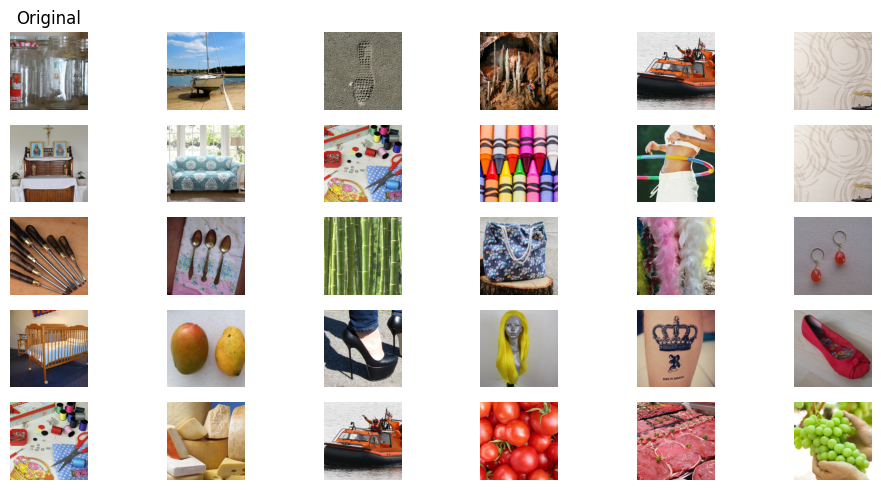

In [19]:
idx=50
fig, ax = plt.subplots(5,6,figsize=(10,5))  


for i in range(5):
    ax[i,0].imshow(Image.open(img_test[idx+i]).convert("RGB").resize((224,224)))
    ax[i,1].imshow(Image.open(selected_images[idx+i][0]).convert("RGB").resize((224,224)))

    ax[i,2].imshow(Image.open(selected_images[idx+i][1]).convert("RGB").resize((224,224)))
    ax[i,3].imshow(Image.open(selected_images[idx+i][2]).convert("RGB").resize((224,224)))
    ax[i,4].imshow(Image.open(selected_images[idx+i][3]).convert("RGB").resize((224,224)))

    ax[i,5].imshow(Image.open(selected_images[idx+i][4]).convert("RGB").resize((224,224)))

    ax[i,0].axis("off")
    ax[i,1].axis("off")
    ax[i,2].axis("off")
    ax[i,3].axis("off")
    ax[i,4].axis("off")
    ax[i,5].axis("off")

ax[0,0].set_title("Original")   


plt.tight_layout()


In [44]:
# compute accuracy

top1_accuracy=accuracy_score(test_classes,selected_classes[:,0])


#compute accuracy for top 5
top5_accuracy=[]
for i in range(len(test_classes)):
    if test_classes[i] in selected_classes[i,:5]:
        top5_accuracy.append(1)
    else:
        top5_accuracy.append(0)

top5_accuracy=np.mean(top5_accuracy)

top1_accuracy,top5_accuracy

(0.005416666666666667, 0.042916666666666665)